In [57]:
import numpy as np
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline 



In [58]:
pd.set_option('display.max_columns', 500) # To display all the columns of dataframe
pd.set_option('max_colwidth', -1) # To set the width of the column to maximum


In [59]:
#load and read the data thoroughly

In [60]:
df=pd.read_csv("HR-Analytics-Employee-Attrition.csv")
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8


In [112]:
df.Attrition.value_counts()

1    1233
0    237 
Name: Attrition, dtype: int64

In [61]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


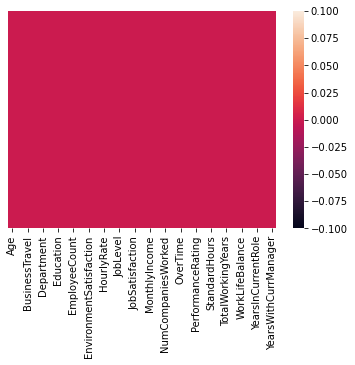

In [62]:
df.isnull().sum()
sns.heatmap(df.isnull(), yticklabels=False)

In [63]:
#there are no null values in the data set. So we move head with the visualizations

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001D3080EF0A0>,
      dtype=object)

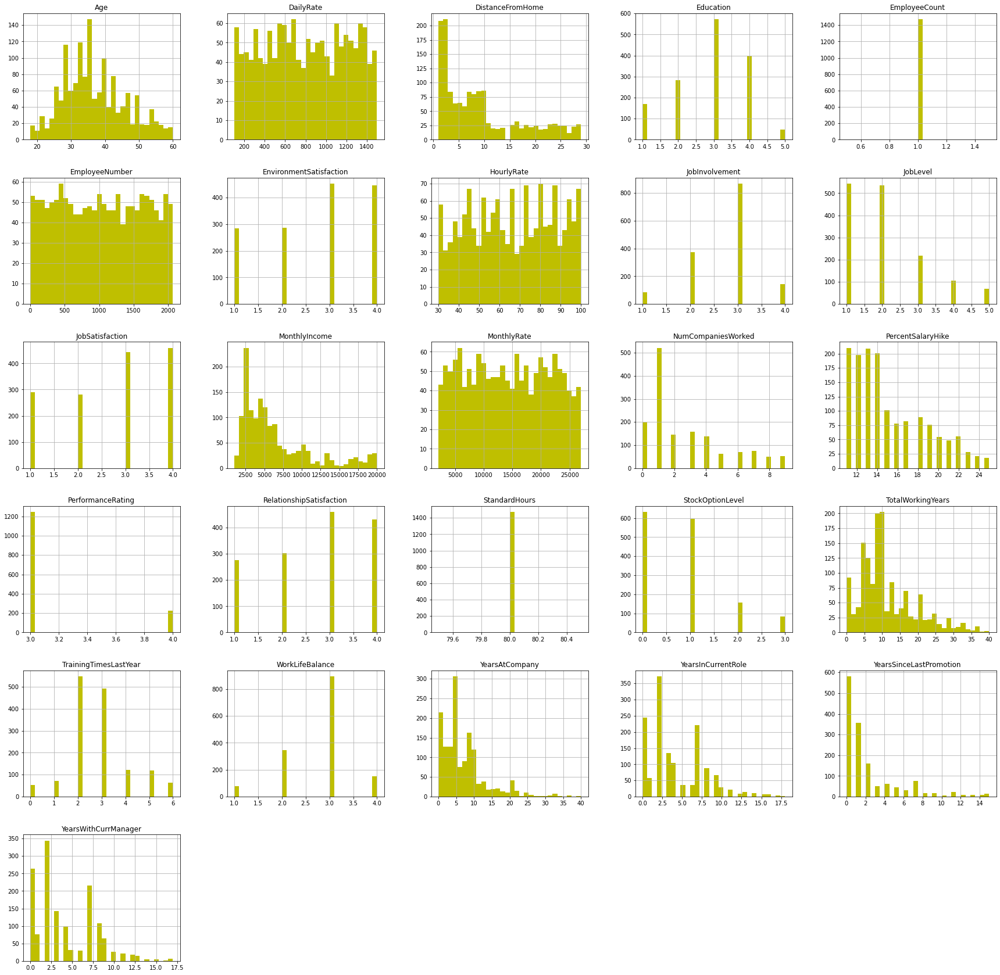

In [64]:
df.hist(bins=30,figsize=(30,30),color='y')

Discuss about the histogram

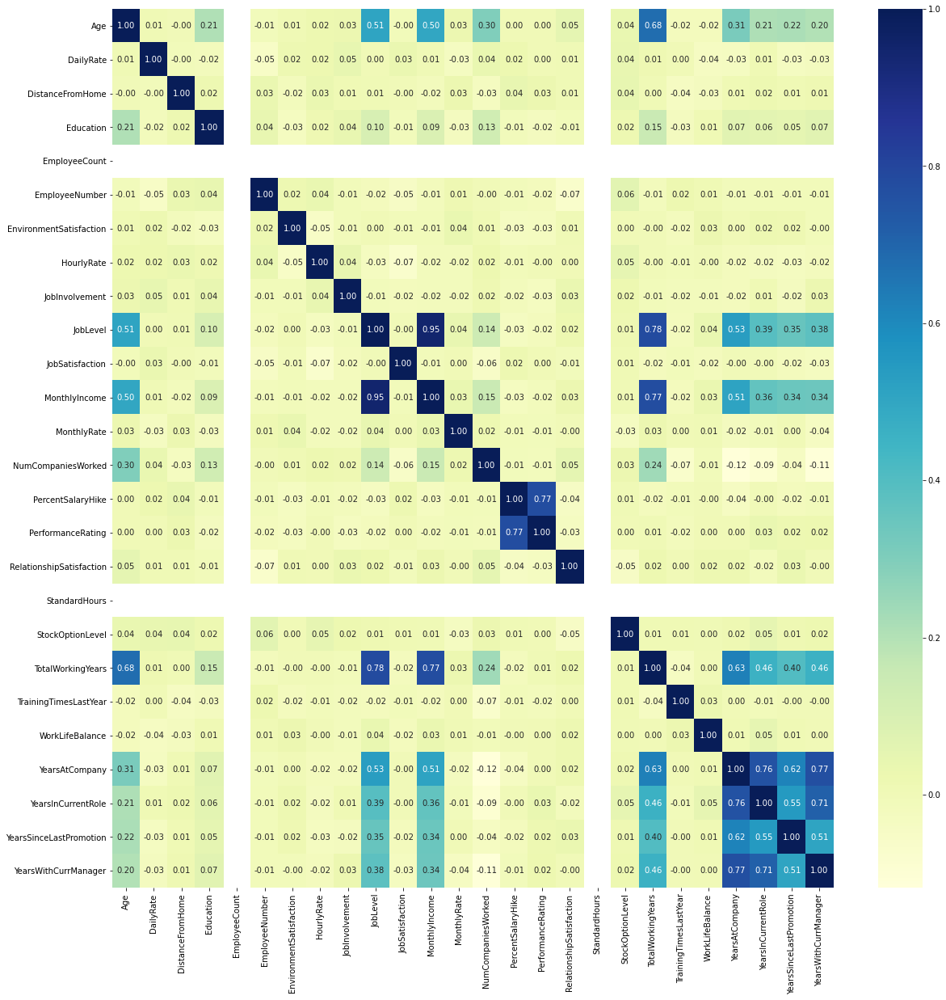

In [65]:
#let's check the correlation between the data
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),cmap='YlGnBu',annot=True,fmt='.2f') # cmap='viridis'
plt.show() #fmt is the annotation(numbers given in the boxes)(.2f means number to be included after 2 decimal places )

In [66]:
#'Age' is correlated highy with 'TotalWorkingYears','JobLevel'
#'JobLevel' strongly correlated with 'TotalWorkingYears', 'YearsAtCompany'.
#monthlyincome totalworkingyears, age
#performance rating is strongly related to performancesalaryhike

In [67]:
#analysis bivariate analysis with the output

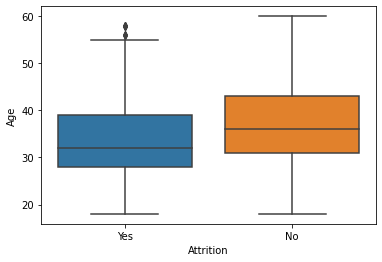

In [68]:
sns.boxplot(x=df.Attrition, y=df.Age)

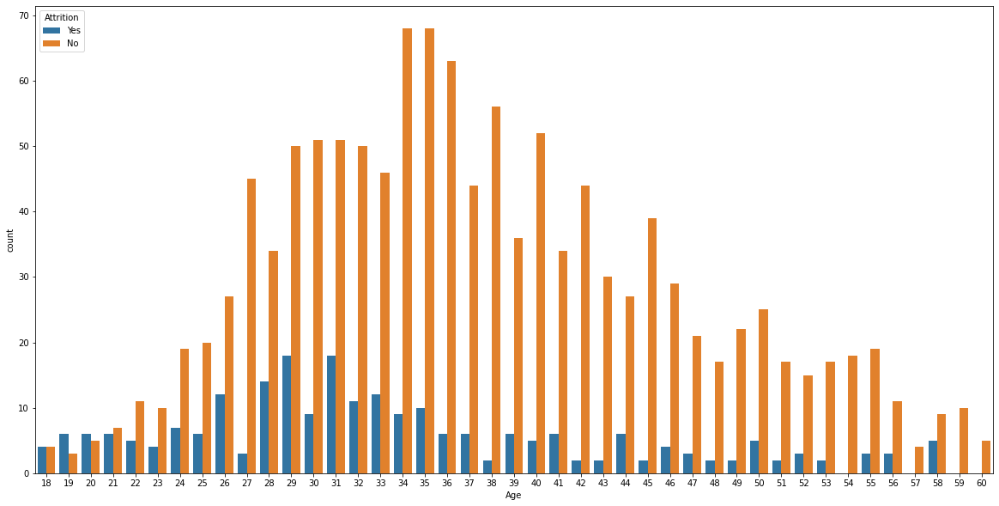

In [69]:
plt.figure(figsize=(20,10))
sns.countplot(df['Age'],hue=df['Attrition'])
plt.show()

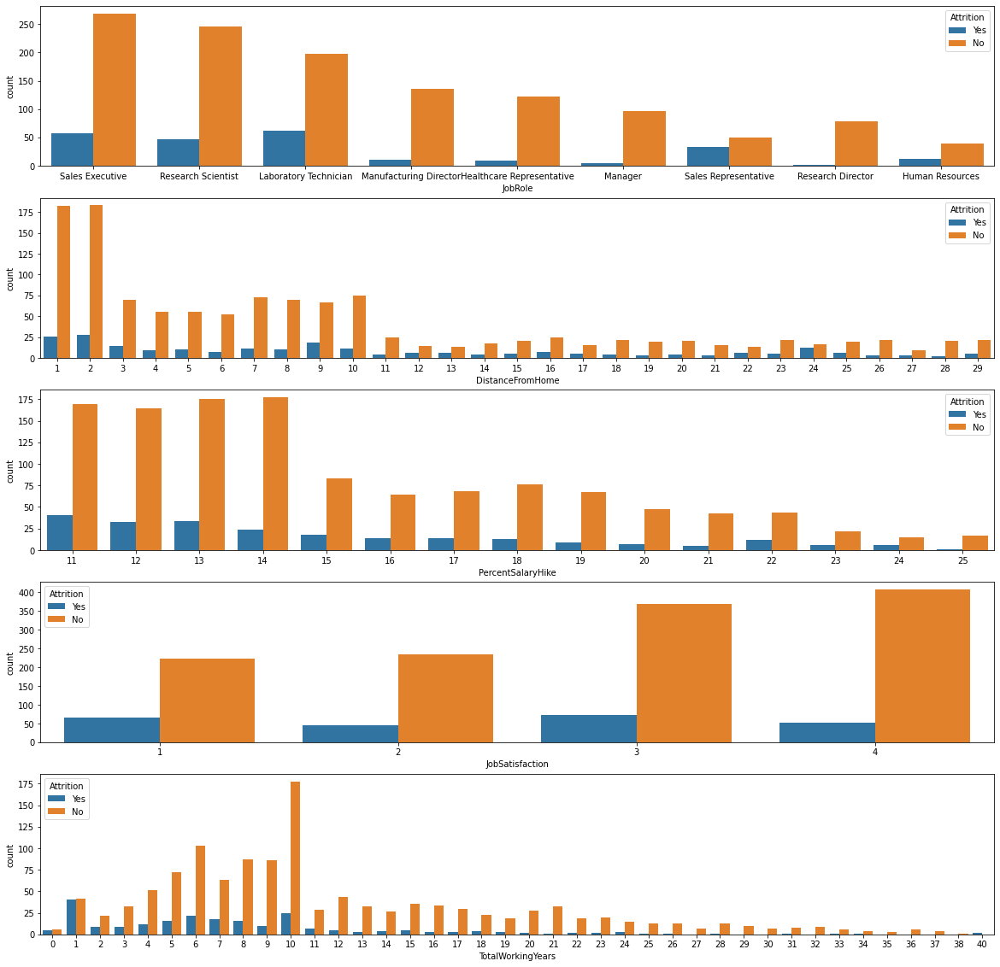

In [70]:
plt.figure(figsize=(20,20))

plt.subplot(511)
sns.countplot(x=df["JobRole"], hue=df["Attrition"])
plt.subplot(512)
sns.countplot(x=df["DistanceFromHome"], hue=df["Attrition"])
plt.subplot(513)
sns.countplot(x=df["PercentSalaryHike"], hue=df["Attrition"])
plt.subplot(514)
sns.countplot(df['JobSatisfaction'],hue=df['Attrition'])
plt.subplot(515)
sns.countplot(df['TotalWorkingYears'],hue=df['Attrition'])

Bi variate analysis within features

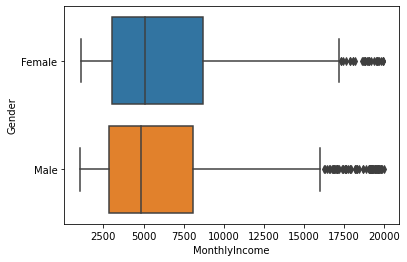

In [71]:
sns.boxplot(x= 'MonthlyIncome',y='Gender',data=df)

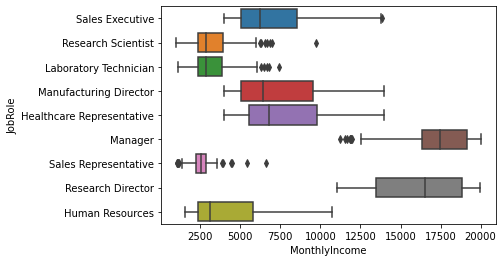

In [72]:
sns.boxplot(x='MonthlyIncome',y='JobRole',data=df)

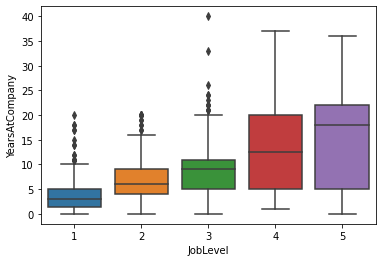

In [73]:
sns.boxplot(x='JobLevel',y='YearsAtCompany',data=df)

In [74]:
df["JobLevel"].value_counts()

1    543
2    534
3    218
4    106
5    69 
Name: JobLevel, dtype: int64

Looking for categorical columns and encoding it.

In [75]:
numcols = df.dtypes[df.dtypes != "object"].index
print("Numerical columns: ", len(numcols))
catcols = df.dtypes[df.dtypes == "object"].index
print("Categorical columns: ", len(catcols))

Numerical columns:  26
Categorical columns:  9


In [76]:
df.columns
#print(df.info())

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [77]:
df[catcols].columns

for cat in df[catcols].columns:
    print(cat, ":" , df[cat].unique())

Attrition : ['Yes' 'No']
BusinessTravel : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Department : ['Sales' 'Research & Development' 'Human Resources']
EducationField : ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
Gender : ['Female' 'Male']
JobRole : ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
MaritalStatus : ['Single' 'Married' 'Divorced']
Over18 : ['Y']
OverTime : ['Yes' 'No']


In [78]:


# pd.get_dummies(df[['Gender','Attrition', 'BusinessTravel', 'Department', 'EducationField',
#        'JobRole', 'MaritalStatus', 'Over18', 'OverTime' ]], drop_first= False) 

In [79]:
#Doing normal one hot encoder for the categorical value since none of them have ranks which help in finding the output.#

In [80]:

df["Gender"]= pd.get_dummies(df["Gender"], drop_first=False)
df["Attrition"]= pd.get_dummies(df["Attrition"], drop_first=False)
df["BusinessTravel"]=pd.get_dummies(df["BusinessTravel"], drop_first=False )
df["Department"]=pd.get_dummies(df["Department"], drop_first=False )
df["EducationField"]=pd.get_dummies(df["EducationField"], drop_first=False ) 
df["JobRole"]=pd.get_dummies(df["JobRole"], drop_first=False )
df["MaritalStatus"]=pd.get_dummies(df["MaritalStatus"], drop_first=False )
df["Over18"]=pd.get_dummies(df["Over18"], drop_first=False )
df["OverTime"]=pd.get_dummies(df["OverTime"], drop_first=False )

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Age                       1470 non-null   int64
 1   Attrition                 1470 non-null   uint8
 2   BusinessTravel            1470 non-null   uint8
 3   DailyRate                 1470 non-null   int64
 4   Department                1470 non-null   uint8
 5   DistanceFromHome          1470 non-null   int64
 6   Education                 1470 non-null   int64
 7   EducationField            1470 non-null   uint8
 8   EmployeeCount             1470 non-null   int64
 9   EmployeeNumber            1470 non-null   int64
 10  EnvironmentSatisfaction   1470 non-null   int64
 11  Gender                    1470 non-null   uint8
 12  HourlyRate                1470 non-null   int64
 13  JobInvolvement            1470 non-null   int64
 14  JobLevel                  1470 non-null 

In [84]:
X=df.drop("Attrition", axis=1)
y=df.Attrition

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,0,1102,0,1,2,0,1,1,2,1,94,3,2,0,4,0,5993,19479,8,1,0,11,3,1,80,0,8,0,1,6,4,0,5
1,49,0,279,0,8,1,0,1,2,3,0,61,2,2,0,2,0,5130,24907,1,1,1,23,4,4,80,1,10,3,3,10,7,1,7
2,37,0,1373,0,2,2,0,1,4,4,0,92,2,1,0,3,0,2090,2396,6,1,0,15,3,2,80,0,7,3,3,0,0,0,0
3,33,0,1392,0,3,4,0,1,5,4,1,56,3,1,0,3,0,2909,23159,1,1,0,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0,591,0,2,1,0,1,7,1,0,40,3,1,0,2,0,3468,16632,9,1,1,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,884,0,23,2,0,1,2061,3,0,41,4,2,0,4,0,2571,12290,4,1,1,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,0,613,0,6,1,0,1,2062,4,0,42,2,3,1,1,0,9991,21457,4,1,1,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,0,155,0,4,3,0,1,2064,2,0,87,4,2,0,2,0,6142,5174,1,1,0,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,0,1023,0,2,3,0,1,2065,4,0,63,2,2,0,2,0,5390,13243,2,1,1,14,3,4,80,0,17,3,2,9,6,0,8


In [102]:
from sklearn.preprocessing import MinMaxScaler
scalar = MinMaxScaler()
X = scalar.fit_transform(X)

Converting into train test and applying in models

In [103]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)

LOGISTIC REGRESSION

In [104]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [105]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [106]:
y_predict = model.predict(X_test)

In [107]:
accuracy_score(y_predict,y_test)

0.8695652173913043

In [108]:
confusion_matrix(y_predict,y_test)

array([[ 13,   8],
       [ 40, 307]], dtype=int64)

In [109]:
print(classification_report(y_predict,y_test))

              precision    recall  f1-score   support

           0       0.25      0.62      0.35        21
           1       0.97      0.88      0.93       347

    accuracy                           0.87       368
   macro avg       0.61      0.75      0.64       368
weighted avg       0.93      0.87      0.89       368



In [113]:
from sklearn.ensemble import RandomForestClassifier
randomforest = RandomForestClassifier()
randomforest.fit(X_train,y_train)

RandomForestClassifier()

In [116]:
y_pred= randomforest.predict(X_test)
print(classification_report(y_pred,y_test))

              precision    recall  f1-score   support

           0       0.21      0.69      0.32        16
           1       0.98      0.88      0.93       352

    accuracy                           0.87       368
   macro avg       0.60      0.78      0.62       368
weighted avg       0.95      0.87      0.90       368



In [122]:
print("Accuracy for randomForest: ", accuracy_score(y_pred,y_test))
print("Confusion Matrix for Random forest:" "\n", confusion_matrix(y_pred,y_test) )

Accuracy for randomForest:  0.8722826086956522
Confusion Matrix for Random forest:
 [[ 11   5]
 [ 42 310]]


In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train,y_train)

In [ ]:
y_pred = xgb.predict(X_test)

In [ ]:
classification_report(y_pred,y_test)

In [ ]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=27,sampling_strategy=1.0)
X_train,y_train = sm.fit_sample(X_train,y_train)

In [ ]:
smote_logistic = LogisticRegression()
smote_logistic.fit(X_train,y_train)

In [ ]:
smote_pred = smote_logistic.predict(X_test)

In [ ]:
classification_report(smote_pred,y_test)

In [ ]:
randomforest = RandomForestClassifier()
randomforest.fit(X_train,y_train)
y_pred_smote = randomforest.predict(X_test)

In [ ]:
classification_report(y_pred_smote,y_test)